# Visualization and Evaluation of cDCGAN Generated Images

In this notebook, I generate fake images conditioned on different classes using the cDCGAN model that I trained on a dataset of artwork labelled with different film genres, e.g. horror, noir, cyberpunk, cartoon, and western. 

The fake images generated for different classes are plotted side by side, and the progression of image generation for the different classes at different epochs in the training process are also shown.

# Import Libraries

In [34]:
# these libraries contain self-defined functions for running the cells below
from modules import *
from plot_and_index import *
from generator_64 import *
from discriminator_64 import *
from weights_init import *
from cdcgan import *
from generate_images import *
from inception_score import *


In [2]:
# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


# Set Parameters

In [3]:
# Root directory for dataset
dataroot = 'images'

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this size using a transformer.
image_size_cifar = 32
image_size_art = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")


# Load Real Dataset for Comparison

The real dataset is resized to 64 x 64 pixels since this was the preprocessing step used during the training of the model. The images for each class of the real dataset are visualized for comparison to the generated data later on below.

In [24]:
from torch.utils.data.sampler import SubsetRandomSampler

def plot_batch(dataloader):    
    '''
    Plot images from a dataloader
    '''
    batch = next(iter(dataloader))
    plt.figure(figsize=(20,12))
    plt.axis("off")
    plt.imshow(np.transpose(vutils.make_grid(batch[0].to(device)[:100],
                padding=2, nrow=8, normalize=True).cpu(),(1,2,0)))


# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                           transforms.Resize(image_size_art),
                           transforms.CenterCrop(image_size_art),
                           transforms.RandomHorizontalFlip(p=0.5),
                           transforms.ToTensor(),
                           transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

target_idx_dct = get_target_index(dataset)
total = 0

for k,v in target_idx_dct.items():
    print(f"Class {k} has {v['length']} entries.")
    total += v['length']
    
print(f"Total number of real images: {total}")
print(dataset.classes)

Class cartoon has 9924 entries.
Class cyberpunk has 9859 entries.
Class horror has 9868 entries.
Class noir has 3567 entries.
Class western has 6344 entries.
Total number of real images: 39562
['cartoon', 'cyberpunk', 'horror', 'noir', 'western']


## Real Cartoon Images

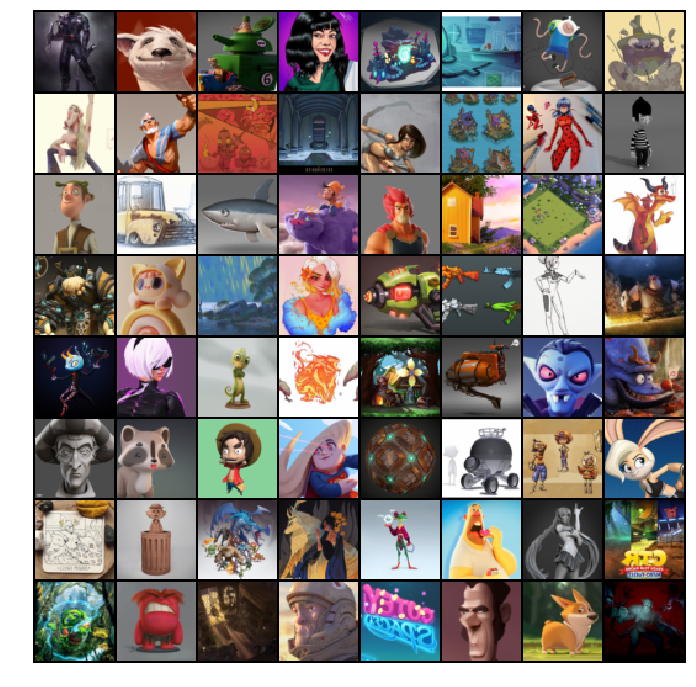

In [27]:
real_cartoon = torch.utils.data.DataLoader(dataset, batch_size = 64, 
                                         sampler = SubsetRandomSampler(target_idx_dct[dataset.classes[0]]['indices']))

plot_batch(real_cartoon)

## Real Cyberpunk Images

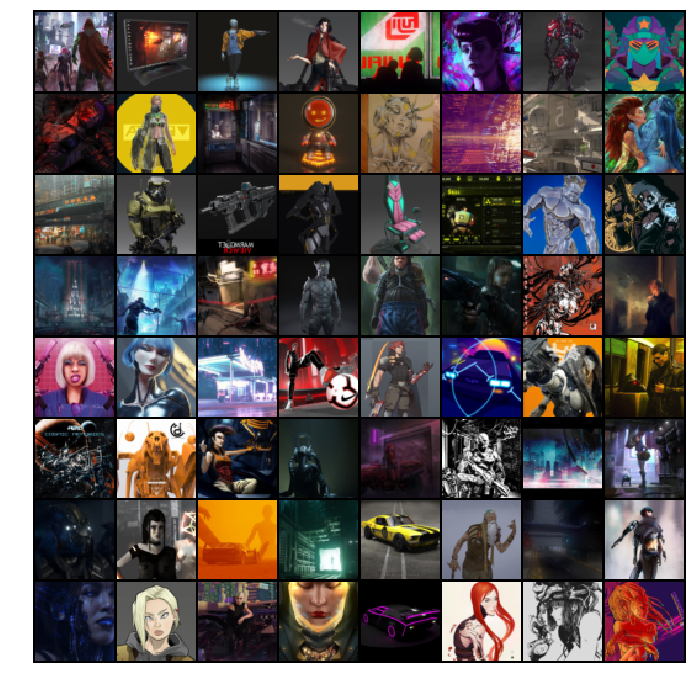

In [28]:
real_cyberpunk = torch.utils.data.DataLoader(dataset, batch_size = 64, 
                                         sampler = SubsetRandomSampler(target_idx_dct[dataset.classes[1]]['indices']))

plot_batch(real_cyberpunk)

## Real Horror Images

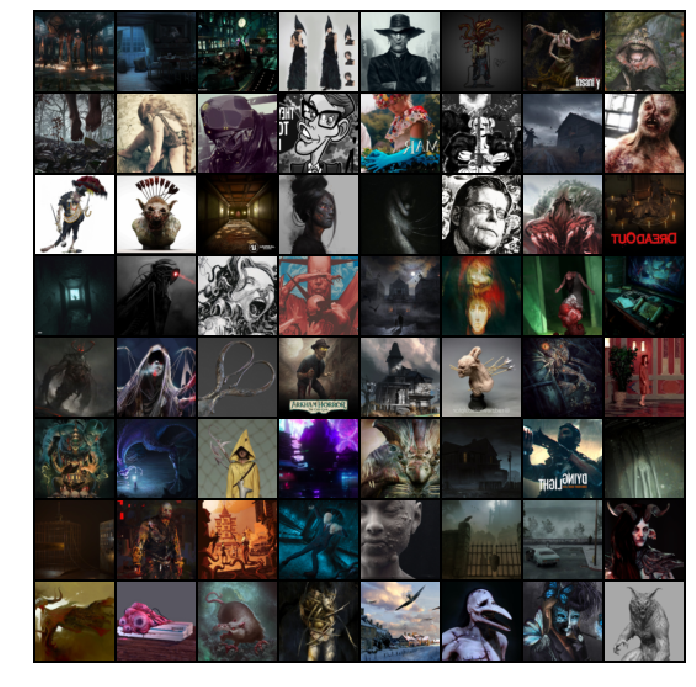

In [29]:
real_horror = torch.utils.data.DataLoader(dataset, batch_size = 64, 
                                         sampler = SubsetRandomSampler(target_idx_dct[dataset.classes[2]]['indices']))

plot_batch(real_horror)

## Real Noir Images

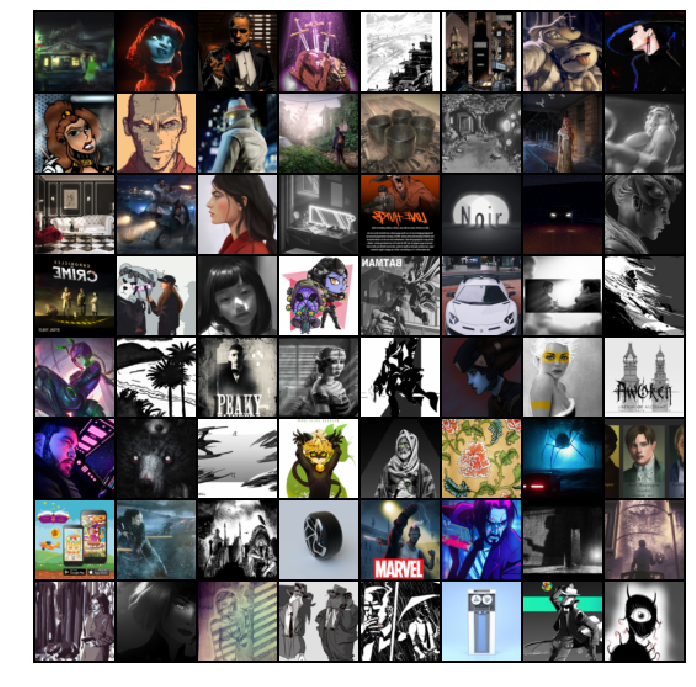

In [30]:
real_noir = torch.utils.data.DataLoader(dataset, batch_size = 64, 
                                         sampler = SubsetRandomSampler(target_idx_dct[dataset.classes[3]]['indices']))

plot_batch(real_noir)

## Real Western Images

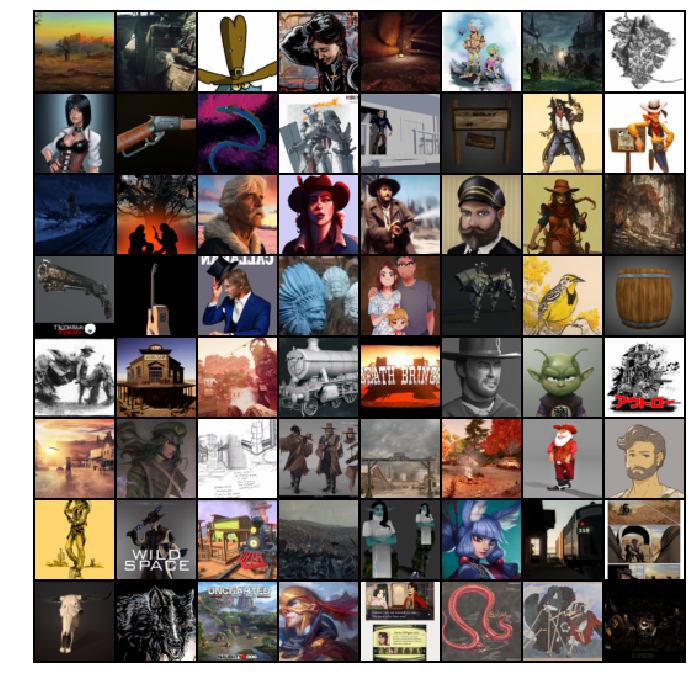

In [31]:
real_western = torch.utils.data.DataLoader(dataset, batch_size = 64, 
                                         sampler = SubsetRandomSampler(target_idx_dct[dataset.classes[4]]['indices']))

plot_batch(real_western)

# Create cDCGAN Object

In [32]:
# Create the Discriminator
netD = Discriminator_64(len(dataset.classes), ngpu, nc = nc, ndf = 64).to(device)

# Apply the weights_init function to randomly initialize all weights to mean=0, stdev=0.2.
netD.apply(weights_init)

# Create the generator
netG = Generator_64(len(dataset.classes), ngpu, nz = nz, nc = nc, ngf = 64).to(device)

# Apply the weights_init function to randomly initialize all weights to mean=0, stdev=0.2.
netG.apply(weights_init)

kwargs = {
    'dataloader': dataloader, # novel data dataloader
    'classes': dataset.classes, # novel dataset classes
    'save_dir':'capstone-novel-eval',
    'num_epochs': 0,
    'criterion': nn.BCELoss(), # Initialize BCELoss function
    'netD': netD,
    'netG': netG,
    'optimizerD': optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999)),
    'optimizerG': optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999)),
    'device': device,
    'nz': nz
}
    
cdcgan_novel = cDCGAN(**kwargs)

capstone-novel-eval directory exists.
capstone-novel-eval/checkpoints directory exists.
capstone-novel-eval/fake_images directory exists.


# Load latest epoch

In [7]:
cdcgan_novel.load('capstone-model-novel-output/checkpoints/checkpoint_e200.pth.tar', disp = True)


=> loading checkpoint: capstone-model-novel-output/checkpoints/checkpoint_e200.pth.tar
=> loaded checkpoint: capstone-model-novel-output/checkpoints/checkpoint_e200.pth.tar
Last epoch was 200


# Generate Fake Images

In [8]:
generate_fake_images(model = cdcgan_novel, classes = dataset.classes, 
                     number_of_images = 0, nz = nz,
                     device = device, 
                     save_dir = 'capstone-novel-eval/fake_images',
                     save = True)


No images to generate. Exiting function.


# Plot Fake Images Generated for Each Class

In [9]:
# import dataset of generated images    
gen_dataset = dset.ImageFolder(
                    root='capstone-novel-eval/fake_images',
                   transform=transforms.Compose([
                   transforms.Resize(image_size_art),
                   transforms.CenterCrop(image_size_art),
                   transforms.RandomHorizontalFlip(p=0.5),
                   transforms.ToTensor(),
                   transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                   ]))

# create dictionary of class indices for generated dataset
target_idx_dct = get_target_index(gen_dataset)
for k,v in target_idx_dct.items():
    print(f"Class {k} has {v['length']} entries.")



Class cartoon has 10000 entries.
Class cyberpunk has 10000 entries.
Class horror has 10000 entries.
Class noir has 10000 entries.
Class western has 10000 entries.


## Generated Cartoon Images

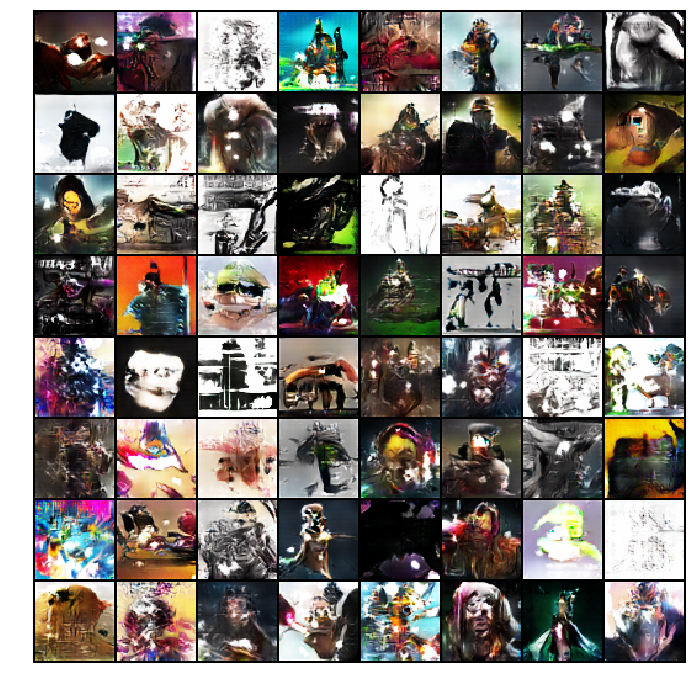

In [10]:
cartoon_dataloader = torch.utils.data.DataLoader(
    gen_dataset, batch_size = 64, 
    sampler = SubsetRandomSampler(target_idx_dct['cartoon']['indices']))

plot_batch(cartoon_dataloader)

## Generated Cyberpunk Images

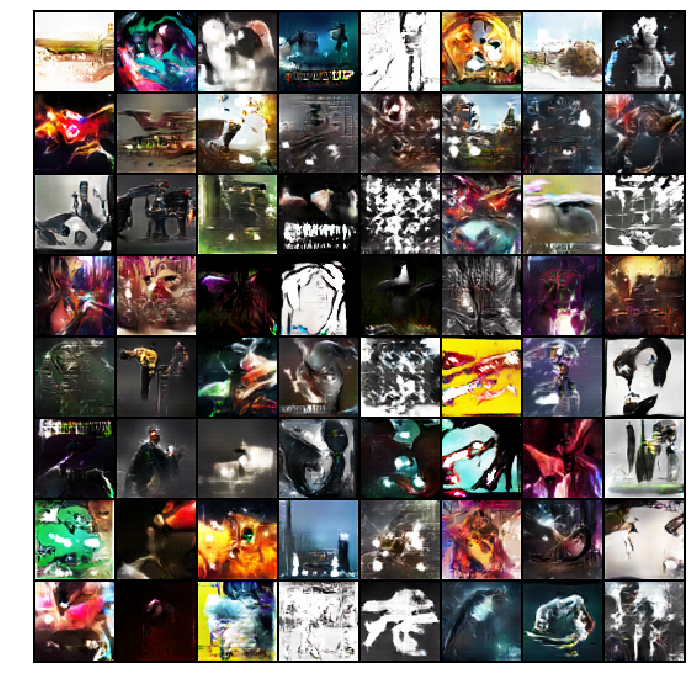

In [11]:
cyberpunk_dataloader = torch.utils.data.DataLoader(
    gen_dataset, batch_size = 64, 
    sampler = SubsetRandomSampler(target_idx_dct['cyberpunk']['indices']))

plot_batch(cyberpunk_dataloader)

## Generated Horror Images

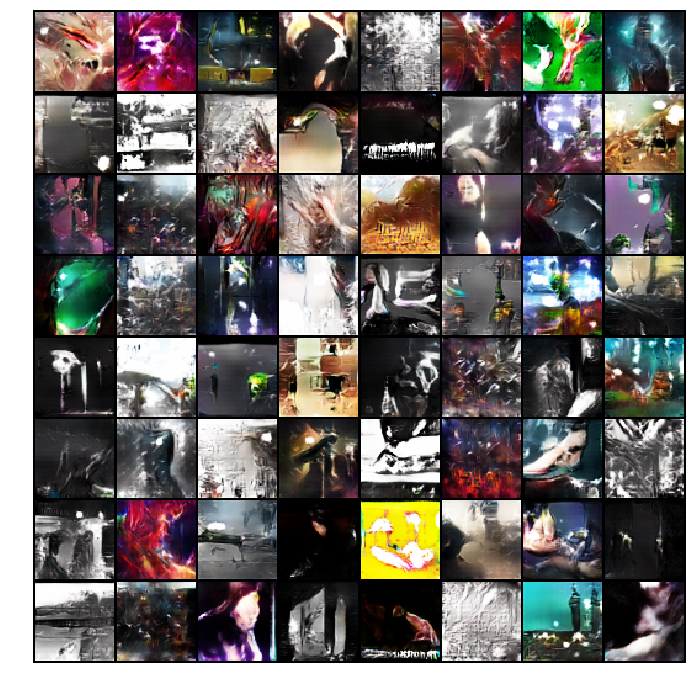

In [12]:
horror_dataloader = torch.utils.data.DataLoader(
    gen_dataset, batch_size = 64, 
    sampler = SubsetRandomSampler(target_idx_dct['horror']['indices']))

plot_batch(horror_dataloader)

## Generated Noir Images

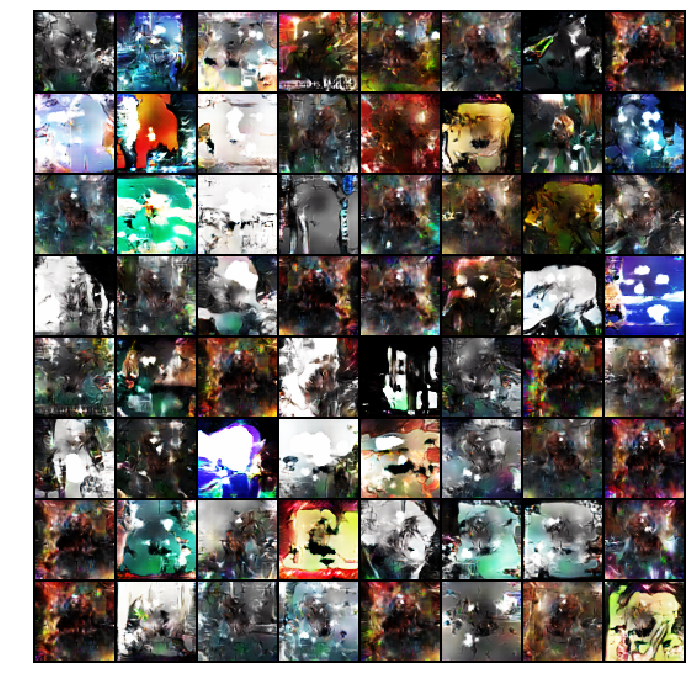

In [13]:
noir_dataloader = torch.utils.data.DataLoader(
    gen_dataset, batch_size = 64, 
    sampler = SubsetRandomSampler(target_idx_dct['noir']['indices']))

plot_batch(noir_dataloader)

## Generated Western Images

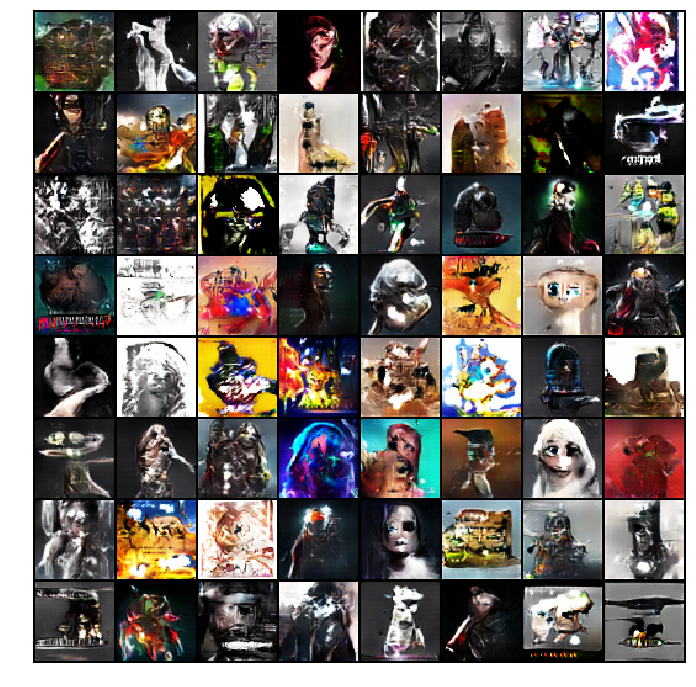

In [14]:
western_dataloader = torch.utils.data.DataLoader(
    gen_dataset, batch_size = 64, 
    sampler = SubsetRandomSampler(target_idx_dct['western']['indices']))

plot_batch(western_dataloader)

# Compare Generated Images between Different Classes

Since the cDCGAN was trained with the film genre name as the embedded conditional, we can observe the effect of the conditional information (the different film genres) on the generated output by comparing the fake images generated when a fixed noise input is used.

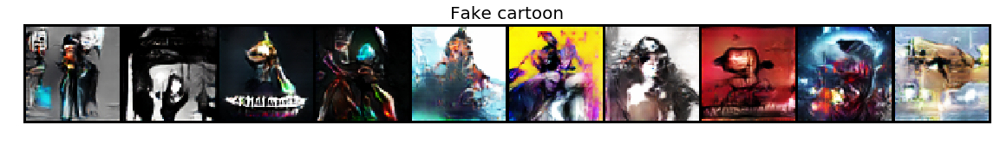

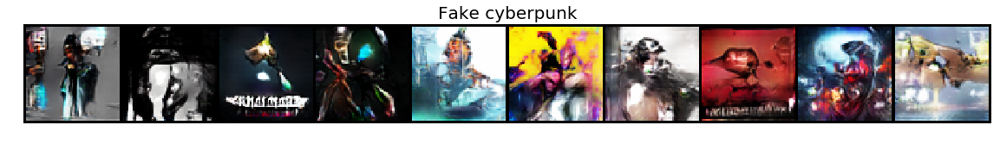

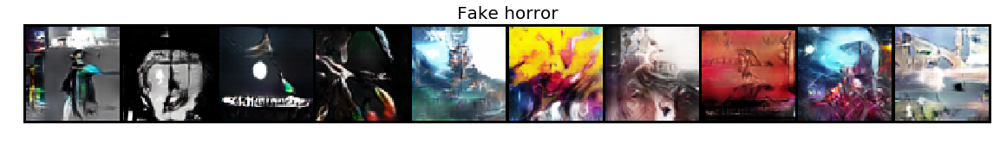

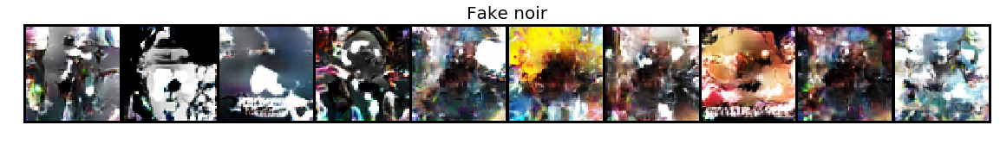

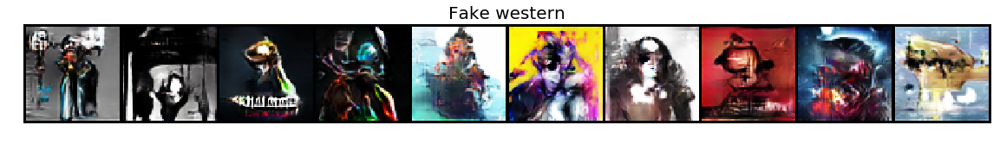

In [15]:
plot_gen_images(dataset.classes, cdcgan_novel, nz = nz, device = device, no_of_images = 10)

# Plot Generated Images at Different Training Epochs

The model weights at each training epoch were saved as checkpoints. As such, the progression of the image generation process for the different classes can be observed.

## Cartoon Class Progression

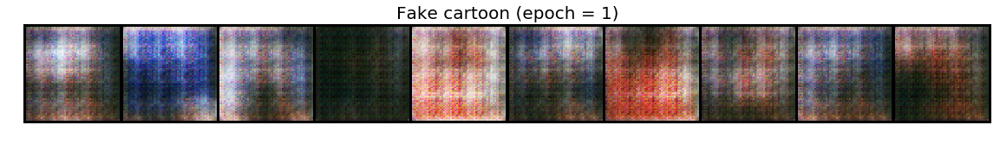

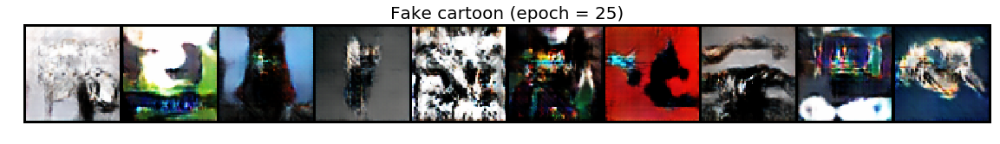

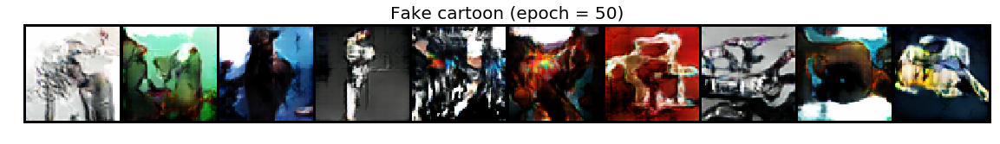

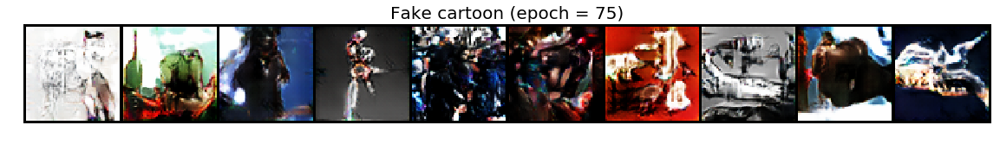

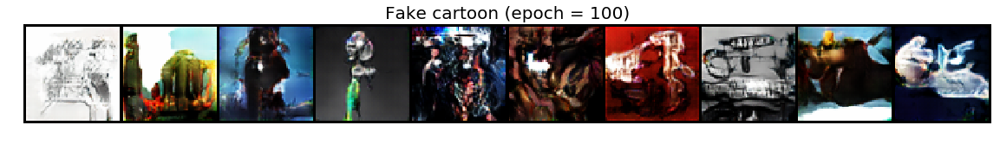

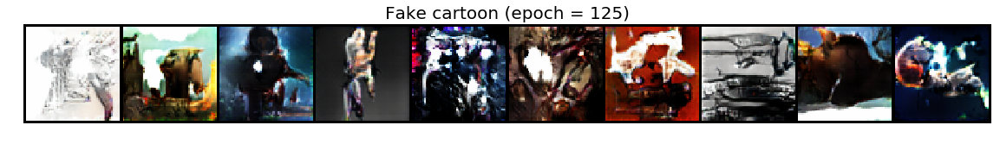

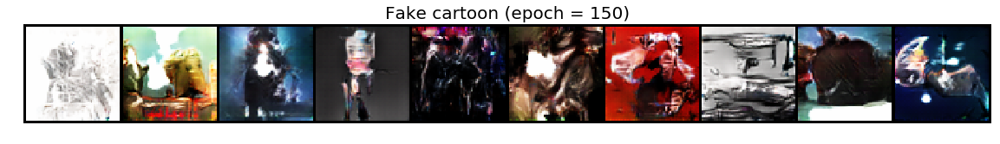

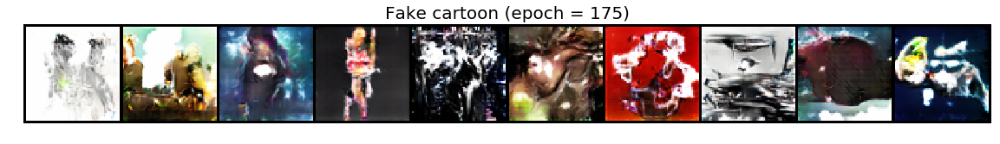

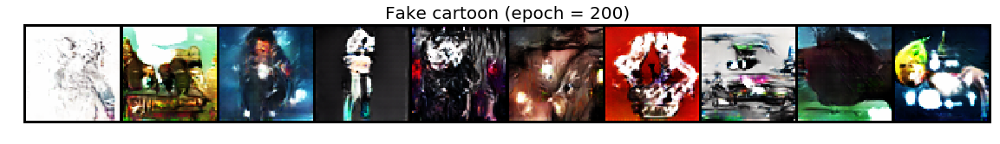

In [16]:
plot_progression(model = cdcgan_novel, classes = dataset.classes, class_name = 'cartoon', 
                 checkpoint_dir = 'capstone-model-novel-output/checkpoints',
                 epoch_list = [1,25,50,75,100,125,150,175,200], no_of_images = 10,
                 nz = nz, device = device)

## Cyberpunk Class Progression

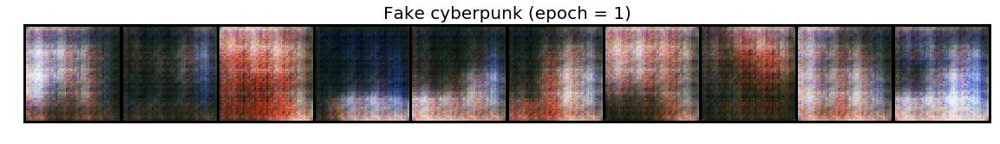

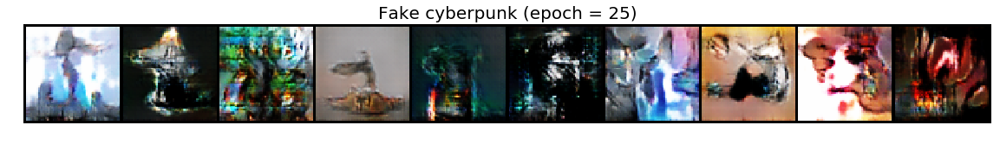

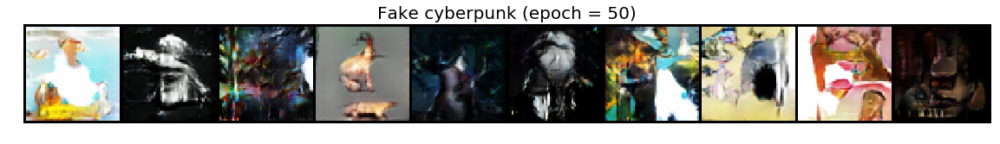

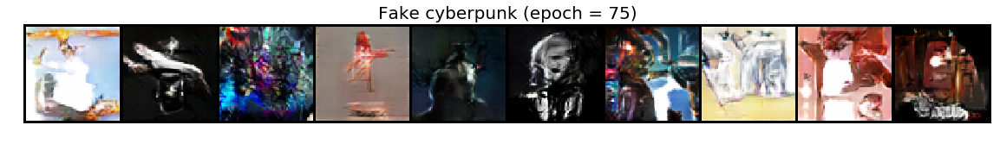

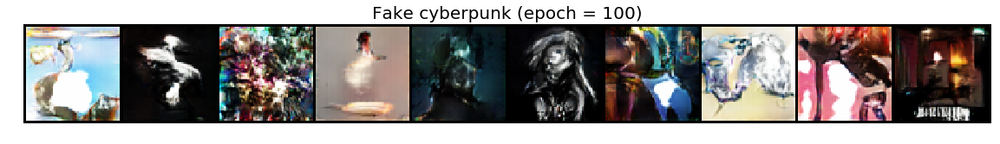

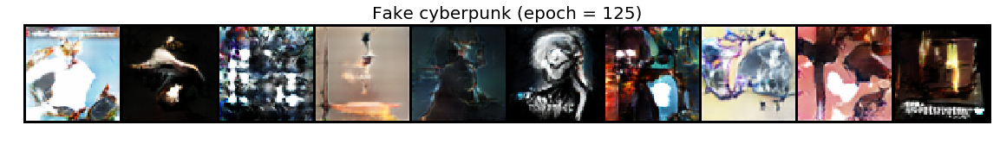

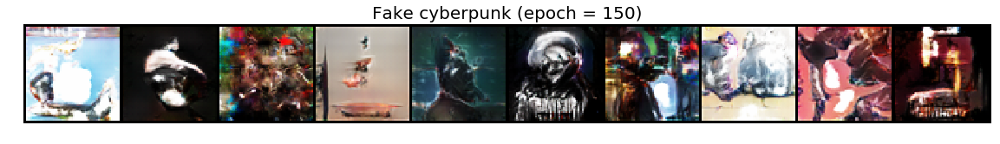

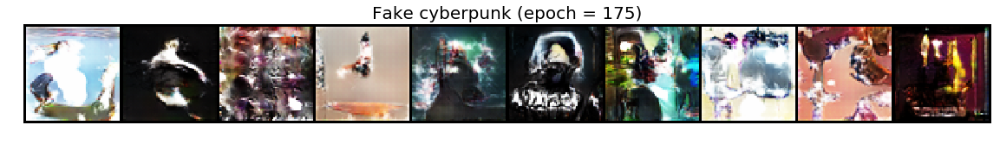

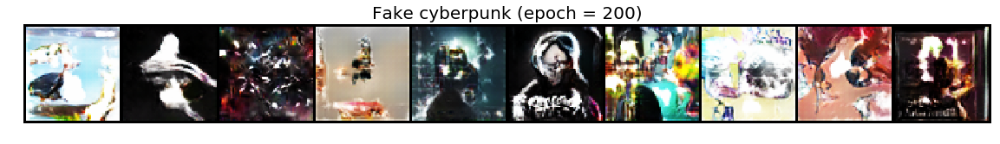

In [19]:
plot_progression(model = cdcgan_novel, classes = dataset.classes, class_name = 'cyberpunk', 
                 checkpoint_dir = 'capstone-model-novel-output/checkpoints',
                 epoch_list = [1,25,50,75,100,125,150,175,200], no_of_images = 10,
                 nz = nz, device = device)

## Horror Class Progression

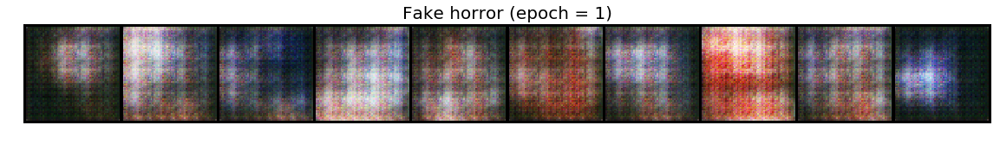

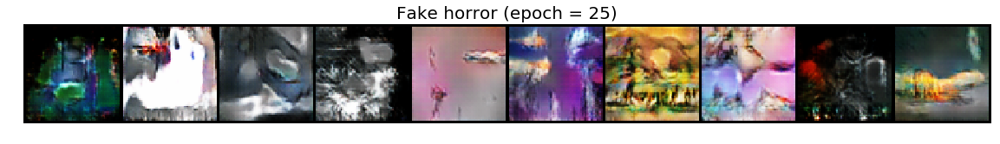

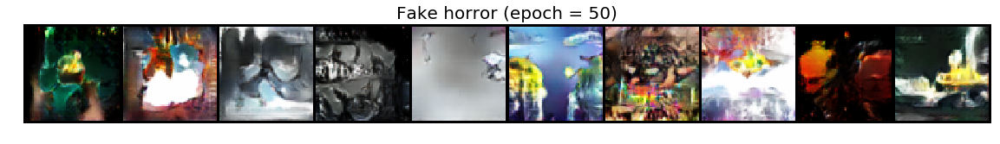

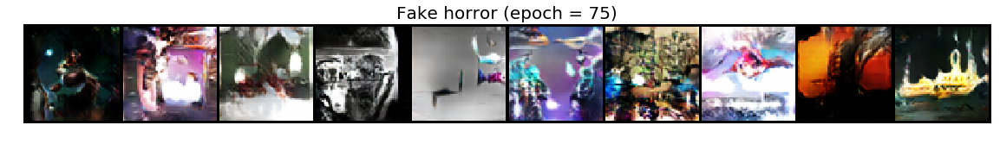

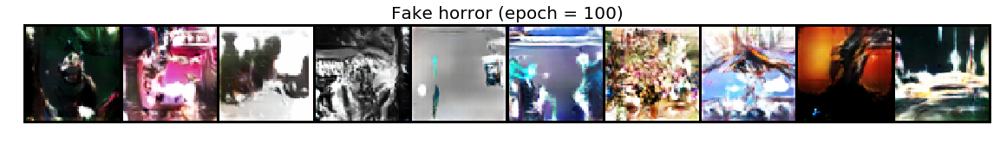

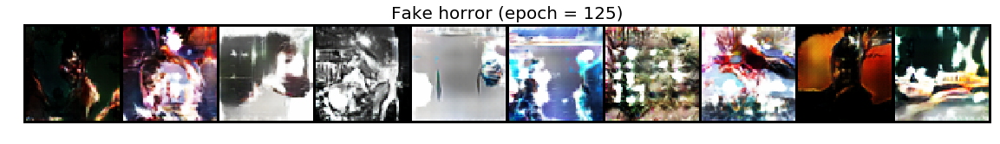

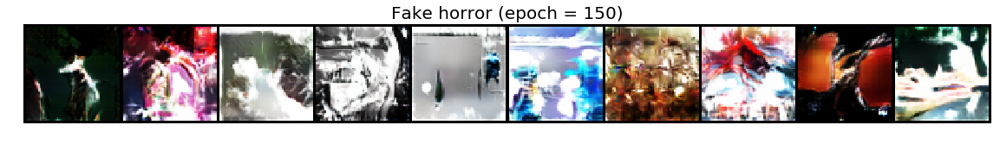

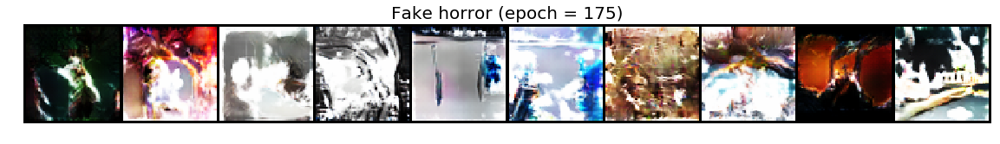

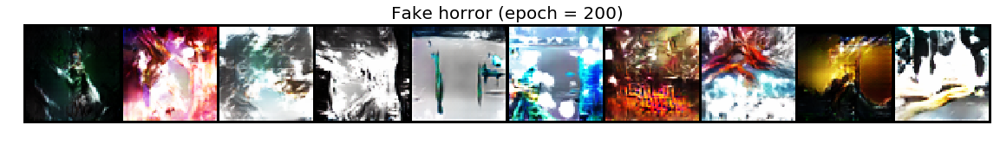

In [17]:
plot_progression(model = cdcgan_novel, classes = dataset.classes, class_name = 'horror', 
                 checkpoint_dir = 'capstone-model-novel-output/checkpoints',
                 epoch_list = [1,25,50,75,100,125,150,175,200], no_of_images = 10,
                 nz = nz, device = device)

## Noir Class Progression

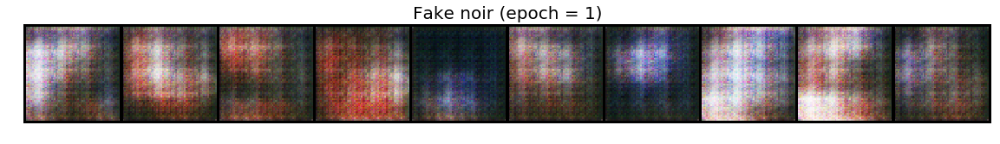

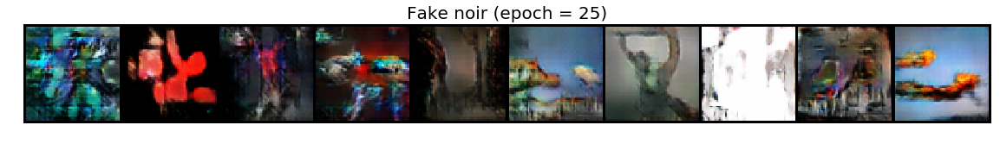

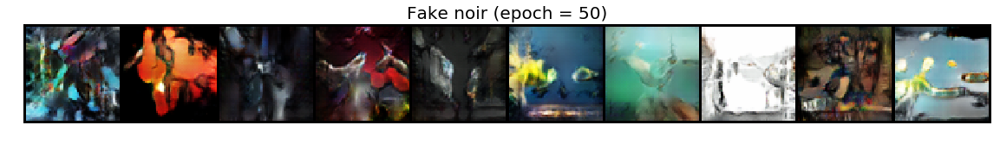

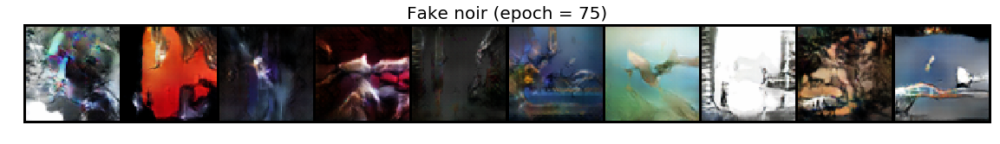

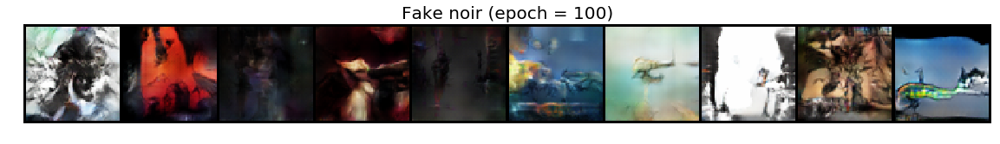

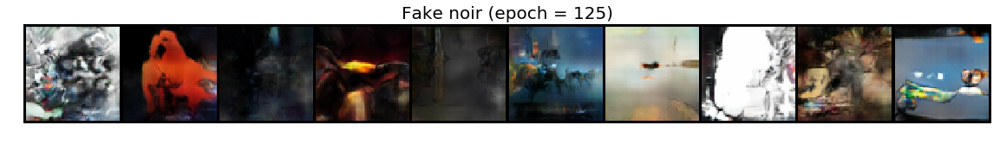

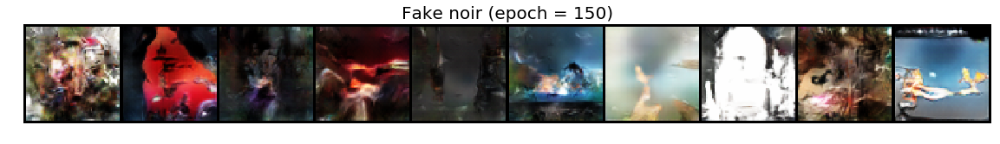

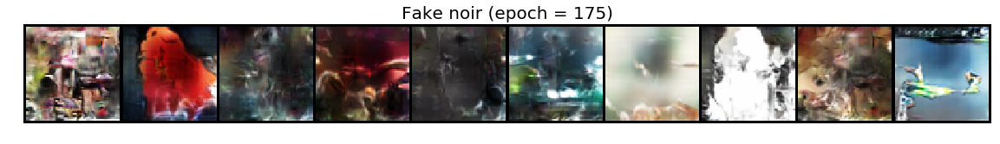

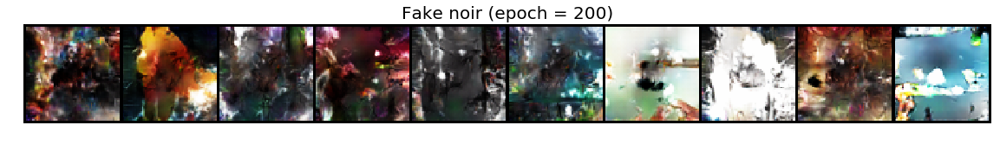

In [20]:
plot_progression(model = cdcgan_novel, classes = dataset.classes, class_name = 'noir', 
                 checkpoint_dir = 'capstone-model-novel-output/checkpoints',
                 epoch_list = [1,25,50,75,100,125,150,175,200], no_of_images = 10,
                 nz = nz, device = device)

## Western Class Progression

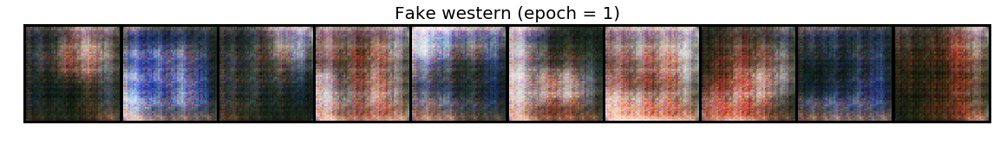

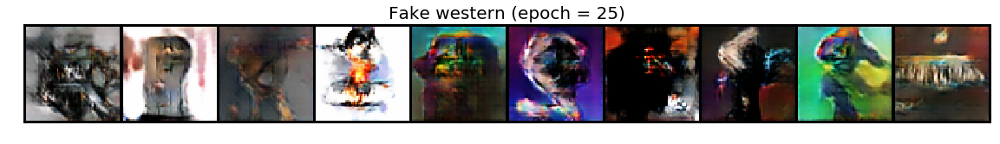

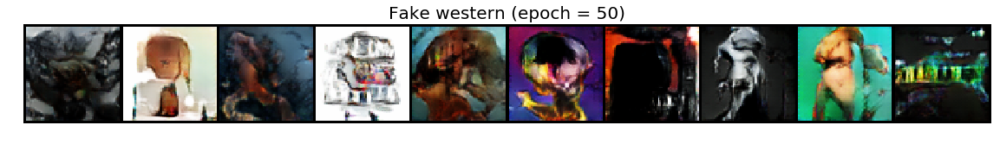

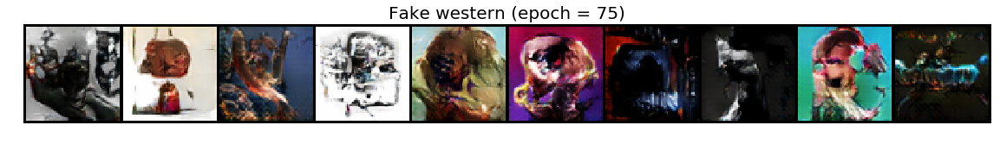

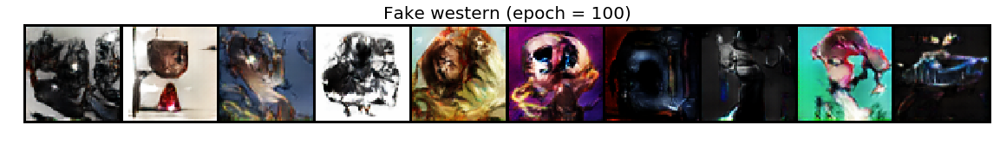

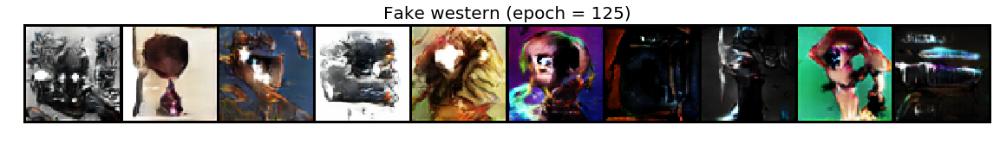

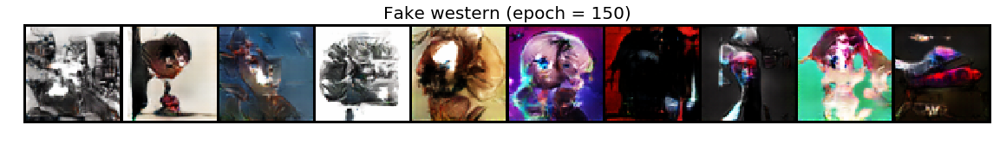

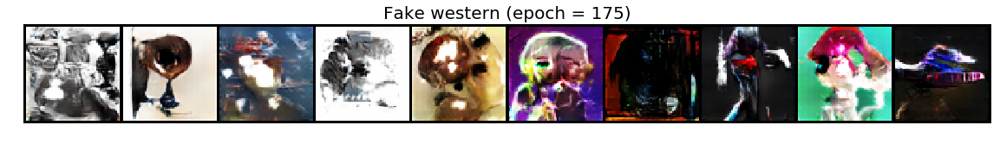

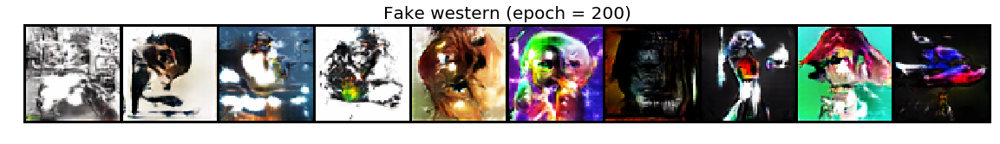

In [21]:
plot_progression(model = cdcgan_novel, classes = dataset.classes, class_name = 'western', 
                 checkpoint_dir = 'capstone-model-novel-output/checkpoints',
                 epoch_list = [1,25,50,75,100,125,150,175,200], no_of_images = 10,
                 nz = nz, device = device)

# Quantitative Metric: Inception Score

In [35]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
print ("Calculating Inception Score for Original Dataset...")
print (inception_score(IgnoreLabelDataset(dataset), cuda=False, batch_size=32, resize=True, splits=10))


Calculating Inception Score for Original Dataset...
